<a href="https://colab.research.google.com/github/CeesGniewyk/Food-Classification/blob/master/Triplet%20Network/Food_Classifications_Triplet_Network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Google Drive & Git

In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content
!git clone https://github.com/Tony607/efficientnet_keras_transfer_learning

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive
/content
Cloning into 'efficientnet_keras_transfer_learning'...
remote: Enumerating objects: 171, done.
remote: Counting objects: 100% (171/171), done.
remote: Compressing objects: 100% (74/74), done.
remote: Total 171 (delta 98), reused 161 (delta 93), pack-reused 0
Receiving objects: 100% (171/171), 5.44 MiB | 10.83 MiB/s, done.
Resolving deltas: 100% (98/98), done.


# Packages

Installing dependencies and useful code snippets

In [2]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm
from sklearn.metrics import confusion_matrix, accuracy_score
import tensorflow as tf
from tensorflow.keras import utils
from tensorflow.keras.models import Sequential, Model, load_model, save_model
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, img_to_array
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, Flatten, GlobalAveragePooling2D
from tensorflow.keras.layers import Input, Convolution2D,  AveragePooling2D, ZeroPadding2D, Reshape, Activation, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, History
from tensorflow.python.keras.utils.data_utils import Sequence

# For plotting pandas dataframes as plotly in google colab:
def plotplease():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
  '''))
  init_notebook_mode(connected=False)

import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

# Pickle for storing files
import pickle
def load_file(file_name):
    f = open(file_name, 'rb')
    read_file = pickle.load(f)
    print("file loaded")
    f.close()
    return read_file

def save_file(file_name, data):
    f = open(file_name, 'wb')
    pickle.dump(data, f, protocol=4)
    print(" file saved")
    f.close()

%cd /content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11

/usr/local/lib/python3.6/dist-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


/content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11


#Normal Model


## Making Imagegenerator

This image generator will make augmentation to the images in the following ways:
- Rotations
- shifting the image horizontally and vertically
- zooming in
- flipping the image
- changing the brightness

In [3]:
# classes correspond to the amount of folders in the directory
categories = ['Jam Sandwich','Yoghurt','Banana','Lemon','Cookies']
num_classes = len(categories)
input_shape=(224, 224, 3)
print("Number of classes: {}".format(num_classes))

Number of classes: 5


In [4]:
train_image_generator = ImageDataGenerator(rescale=1./255,
                                           rotation_range=360,
                                           width_shift_range=0.2,
                                           height_shift_range=0.2,
                                           horizontal_flip=True,
                                           vertical_flip=True,
                                           zoom_range=0.1,
                                           brightness_range=[0.7,1.3]
                                          )
test_image_generator = ImageDataGenerator(rescale=1./255,
                                           rotation_range=360,
                                           width_shift_range=0.2,
                                           height_shift_range=0.2,
                                           horizontal_flip=True,
                                           vertical_flip=True,
                                           zoom_range=0.1,
                                          brightness_range=[0.7,1.3]
                                          )

train_data_gen = train_image_generator.flow_from_directory(batch_size=num_classes,
                                                            directory="Triplet Model/data/v3/train/",
                                                            shuffle=False,
                                                            target_size=(224, 224),
                                                            class_mode='categorical')

test_data_gen = train_image_generator.flow_from_directory(batch_size=num_classes,
                                                          directory="Triplet Model/data/v3/test/",
                                                          shuffle=False,
                                                          target_size=(224, 224),
                                                          class_mode='categorical')

Found 5 images belonging to 5 classes.
Found 5 images belonging to 5 classes.


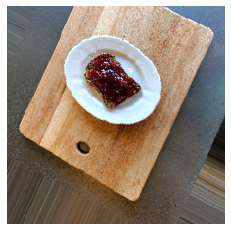

Class is: Jam Sandwich


In [5]:
#@title Showing training set example {run:"auto"}
category = 0 #@param [0,1,2,3,4] {type:"raw"}
train_images, train_image_label = next(train_data_gen)
image = train_images[category]
label = train_image_label[category]
plt.imshow(image)
plt.axis("off")
plt.show()
print("Class is: {}".format(categories[category]))

## Making Dataset using generator

In this section I make the datasets using the generator. <br>
The Triplet Dataset is made to be smaller to speed up creation of triplets.
The choice is made to make a separate dataset for convenience. <br>
The following datasets are made:


*   Training Set (1000 samples, 200 per class)
*   Test Set (500 samples, 100 per class)
*   Triplet Set (200 samples, 40 per class)




### Making Training Set

In [0]:
# Make the dataset
images_train, labels_train = next(train_data_gen)
# increase dataset size
for i in tqdm(range(0,199)):
    images_new, labels_new = next(train_data_gen)
    images_train = np.concatenate((images_train,images_new),axis=0)
    labels_train = np.concatenate((labels_train,labels_new),axis=0)

KeyboardInterrupt: ignored

### Making Test Set

In [0]:
# Make the dataset
images_test, labels_test = next(train_data_gen)
# increase dataset size
for i in tqdm(range(0,99)):
    images_new, labels_new = next(test_data_gen)
    images_test = np.concatenate((images_test,images_new),axis=0)
    labels_test = np.concatenate((labels_test,labels_new),axis=0)

### Making set for training triplets

In [0]:
# Make the dataset
images_triplet, labels_triplet = next(train_data_gen)
# increase dataset size
for i in tqdm(range(0,39)):
    images_new, labels_new = next(train_data_gen)
    images_triplet = np.concatenate((images_triplet,images_new),axis=0)
    labels_triplet = np.concatenate((labels_triplet,labels_new),axis=0)

### Saving Data

In [0]:
%cd /content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11/Triplet Model
save_file("images_train", images_train)
save_file("labels_train", labels_train)
save_file("images_test", images_test)
save_file("labels_test", labels_test)
save_file("images_triplet", images_triplet)
save_file("labels_triplet", labels_triplet)
%cd /content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11

/content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11/Triplet Model
 file saved
 file saved
 file saved
 file saved
 file saved
 file saved
/content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11


## Loading Data

In [6]:
%cd /content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11/Triplet Model
images_train = load_file("images_train")
labels_train = load_file("labels_train")
images_test = load_file("images_test")
labels_test = load_file("labels_test")
images_triplet = load_file("images_triplet")
labels_triplet = load_file("labels_triplet")
%cd /content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11

/content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11/Triplet Model
file loaded
file loaded
file loaded
file loaded
file loaded
file loaded
/content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11


##Changing Pre-trained Model

A new Dense layer of 100 is added to give the model some space to create meaningful features for the last dense layer when using the model for a triplet network <br>
Currently the model has two dense layers of size 100, the last one will be used as a meaningful embedding of the input image. The first layer will be changed to reduce loss in the triplet function.

### Loading & Changing Model

In [7]:
%cd /content/efficientnet_keras_transfer_learning/
from efficientnet import EfficientNetB0 as Net
#Reconstruct model architecture
model_effinet = Net(weights="imagenet", include_top=False, input_shape=input_shape)
model = Sequential()
model.add(model_effinet)
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.35))
model.add(Dense(100, activation='relu'))
model.add(Dense(11, activation='softmax'))
%cd /content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11
#Load Weights of pre-trained model
model.load_weights("Efficientnet B0 Model/weights_food_model")
#Remove last layer, add another embedding layer and add the correct size for classes
model.pop()
model.add(Dense(num_classes, activation='softmax'))
model.summary()

# Freeze the layers except the last 2 layers
for layer in model.layers[:-2]:
    layer.trainable = False
# Check the trainable status of the individual layers
for layer in model.layers:
    print(layer, layer.trainable)
model.compile(loss='categorical_crossentropy', optimizer= 'adam',metrics=['accuracy'])

/content/efficientnet_keras_transfer_learning

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Using TensorFlow backend.



Instructions for updating:
Deprecated in favor of operator or tf.math.divide.
16719872/16717576 [==============================] - 1s 0us/step
/content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b0 (Model)      (None, 7, 7, 1280)        4049564   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 100)               128100    
_________________________________________________________________
dense_2 (Dense)              (None, 5)                 505       
Total params: 4,178,169
Trai

Checking the current performance of the model without finetuning:

In [8]:
model.evaluate(images_test,labels_test,verbose=0)[1]

0.462

As can be seen the performance is bad. (Accuracy = 22.8%, since there are 5 classes this is basically a random guess) <br>
 The model has been trained on the Food-11 dataset and has not been retrained for the new dataset. <br>
This will be covered in the next section

### Retraining Model

#### Using Generator (slow)
You can train the model using the generator, but we've already prepared a training set.

In [0]:
history = model.fit_generator(
    generator = train_data_gen,
    steps_per_epoch=5,
    epochs=20,
    use_multiprocessing=True
)

#### Using Generated Training Set (fast)

In [9]:
history = model.fit(
    images_train,
    labels_train,
    batch_size=32,
    epochs=100,
    use_multiprocessing=True
)

Train on 1000 samples
Epoch 1/100
1000/1000 [==============================] - 2s 2ms/sample - loss: 1.5645 - acc: 0.3400
Epoch 2/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 1.1658 - acc: 0.5460
Epoch 3/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.9920 - acc: 0.6700
Epoch 4/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.8554 - acc: 0.7460
Epoch 5/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.7503 - acc: 0.8160
Epoch 6/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.6653 - acc: 0.8400
Epoch 7/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.5933 - acc: 0.9000
Epoch 8/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.5528 - acc: 0.8880
Epoch 9/100
1000/1000 [==============================] - 1s 1ms/sample - loss: 0.4953 - acc: 0.9200
Epoch 10/100
1000/1000 [==============================] - 1s 1ms/sample - loss

## Evaluation

In [10]:
model.evaluate(images_test,labels_test,verbose=0)[1]

0.896

When evaluating the model results, we can see that it achieves an accuracy of 79.4% on the test set, even though the model performed with an accuracy of 99.2% on the training set. <br>
Let's evaluate the confidence of the model when making predictions. <br>
For every image the Model has a certain confidence when making this prediction.<br>
Have a look at the following output where we show the confidence of the training set

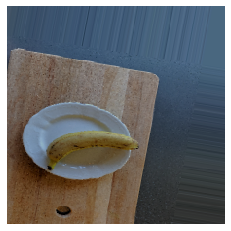

Class is: Banana
Predicted Class is: Banana


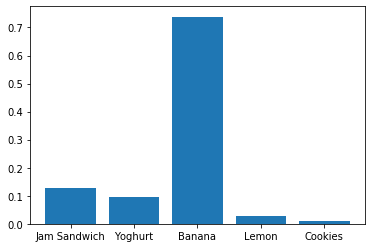

In [0]:
#@title Performance on test set generator{run:"auto"}
category = 2 #@param [0,1,2,3,4] {type:"raw"}
test_images, test_image_label = next(test_data_gen)
image = test_images[category]
label = test_image_label[category]
plt.imshow(image)
plt.axis("off")
plt.show()
print("Class is: {}".format(categories[category]))
x = np.expand_dims(test_images[category], axis=0)
prediction = model.predict(x)
plt.bar(categories,prediction[0])
print("Predicted Class is: {}".format(categories[np.argmax(prediction)]))

For some classes it is very confident about the prediction. <br>
For other classes it is less confident and even makes mistakes. <br>
In the next few cells we show the average confidence of a certain class by summerizing the confidence of each image.

### Evaluation on the confidence of the model

In [0]:
#Function to get the total average confidence
def get_confidence(dataset):
  predictions = model.predict(dataset)
  confidence = np.zeros((num_classes,num_classes))
  for i in range(len(predictions)):
    confidence[i%num_classes]+= predictions[i]
  confidence = confidence/(len(predictions)/num_classes)
  return confidence

In the following graphs the total confidence of all the training examples is shown. <br>
The top graph is for the training set, the bottom graph for the test set.<br>
Let's first inspect the training set <br>
On te right side you can select which images you'd like to inspect, the bar charts then show for that type how confident it is <br>
For example: In orange you see the average distribution of confidence for prediction for the Jam Sandwich class. You can see the yellow bar over the Jam Sandwich class which means that for all images it's very confident it's a Jam Sandwich. <br>
For the Banana class, which is represented as Green, you can see that it's not so confident about it. In the Test set you can see that overall it's more confident that Banana photo's are actually Yoghurt.

In [0]:
plotplease()
confidence_train = get_confidence(images_train)
confidence_test = get_confidence(images_test)
pd.DataFrame(confidence_train, index=categories, columns=categories).transpose().iplot(kind='bar',title="Training Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')
pd.DataFrame(confidence_test, index=categories, columns=categories).transpose().iplot(kind='bar',title="Test Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')

## Saving Model

In [0]:
model.save_weights("Triplet Model/data/base_model")

# Triplet Model

##Recreating Model

In [0]:
%cd /content/efficientnet_keras_transfer_learning/
from efficientnet import EfficientNetB0 as Net
#Reconstruct model architecture
model_effinet = Net(weights="imagenet", include_top=False, input_shape=input_shape)
base_model = Sequential()
base_model.add(model_effinet)
base_model.add(GlobalAveragePooling2D())
base_model.add(Dropout(0.35))
base_model.add(Dense(100, activation='relu'))
base_model.add(Dense(5, activation='softmax'))
%cd /content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11
#Load Weights of pre-trained model
base_model.load_weights("Triplet Model/data/base_model")
#Remove last layer, add another embedding layer and add the correct size for classes
base_model.pop()
classification_model_input = Input(input_shape)
classification_model_middle = base_model(classification_model_input)
classification_model_output = Dense(num_classes, activation='softmax')(classification_model_middle)
classification_model = Model(inputs=classification_model_input, outputs=classification_model_output)
classification_model.summary()
classification_model.layers[1].summary()
# Freeze the layers except the last 2 layers
for layer in base_model.layers[:-1]:
    layer.trainable = False
# Check the trainable status of the individual layers
for layer in base_model.layers:
    print(layer, layer.trainable)
classification_model.compile(loss='categorical_crossentropy', optimizer= 'adam',metrics=['accuracy'])

/content
fatal: destination path 'efficientnet_keras_transfer_learning' already exists and is not an empty directory.
/content/efficientnet_keras_transfer_learning
/content/drive/My Drive/Project Support List/Practical Edge Computing/Data/food11
Model: "model_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_21 (InputLayer)        [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential_8 (Sequential)    (None, 100)               4177664   
_________________________________________________________________
dense_26 (Dense)             (None, 5)                 505       
Total params: 4,178,169
Trainable params: 4,136,153
Non-trainable params: 42,016
_________________________________________________________________
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Sha

## Making Triplets

In [0]:
base_model.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b0 (Model)      (None, 7, 7, 1280)        4049564   
_________________________________________________________________
global_average_pooling2d_8 ( (None, 1280)              0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 1280)              0         
_________________________________________________________________
dense_24 (Dense)             (None, 100)               128100    
Total params: 4,177,664
Trainable params: 128,100
Non-trainable params: 4,049,564
_________________________________________________________________


In [0]:
embeddings = base_model.predict(images_triplet)
embeddings.shape

(200, 100)

In [0]:
margin = 0
def calculate_loss(anchor,positive,negative):
  distance_positive = np.sum(np.square(embeddings[anchor]-embeddings[positive]))
  distance_negative = np.sum(np.square(embeddings[anchor]-embeddings[negative]))
  loss = max(0.0,margin + distance_positive-distance_negative)
  return loss

In [0]:
# make the possible triplets
a = list()
b = list()
for i in tqdm(range(len(labels_triplet))):
  for j in range(len(labels_triplet)):
    if i!=j:
      if i%num_classes == j%num_classes:
        for k in range(len(labels_triplet)):
            if i%num_classes == k%num_classes:
              continue
            a.append([i,j,k])
            b.append(calculate_loss(i,j,k))

a = np.array(a)
b = np.array(b)

In [0]:
# Sort the triplets highest error first
error = (-b).argsort()
sortedtriplet = a[error]
print("Amount of Triplets = {}".format(len(sortedtriplet)))
print("Sorted Triplets:")
print(sortedtriplet[0:10])
print("Sorted Error:")
print(b[error][0:10])
triplet_train = sortedtriplet[0:1000]

Amount of Triplets = 1248000
Sorted Triplets:
[[145 115  37]
 [145 115  11]
 [145 115 151]
 [145 115 162]
 [145 115  86]
 [145 115 157]
 [145 115 112]
 [145 115  43]
 [145 115  77]
 [145 115  22]]
Sorted Error:
[142.31124878 139.36249161 138.92149734 137.74420547 137.23179626
 136.84910965 135.99183655 135.90919876 135.44506073 134.58104324]


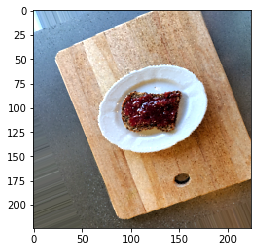

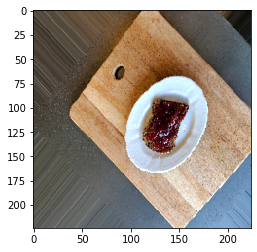

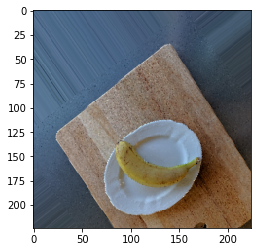

In [0]:
#Anchor, Positive,  Negative
# This is the worst performing triplet, meaning that the negative is closer to the anchor than the positive is
x,y,z = sortedtriplet[0]
plt.imshow(images_triplet[x])
plt.show()
plt.imshow(images_triplet[y])
plt.show()
plt.imshow(images_triplet[z])
plt.show()

In [0]:
h,w,d = input_shape
anchors = np.zeros((len(triplet_train), h, w, d))
positives = np.zeros((len(triplet_train), h, w, d))
negatives = np.zeros((len(triplet_train), h, w, d))
triplets_labels = np.zeros((len(triplet_train), 3,5))
for i in tqdm(range(len(triplet_train))):
  anchors[i] = images_triplet[triplet_train[i][0]]
  positives[i] = images_triplet[triplet_train[i][1]]
  negatives[i] = images_triplet[triplet_train[i][2]]
  triplets_labels[i][0] = labels_triplet[triplet_train[i][0]]
  triplets_labels[i][1] = labels_triplet[triplet_train[i][1]]
  triplets_labels[i][2] = labels_triplet[triplet_train[i][2]]
triplet_model_input = [anchors,positives,negatives]

## Define Triplet Loss

In [0]:
def triplet_loss(ground_truth, network_output):

    anchor, positive, negative = tf.split(network_output, num_or_size_splits=3, axis=1)        
    
    for embedding in [anchor, positive, negative]:
        embedding = tf.math.l2_normalize(embedding)

    pos_dist = tf.reduce_sum(tf.square(tf.subtract(anchor, positive)), axis=1)
    neg_dist = tf.reduce_sum(tf.square(tf.subtract(anchor, negative)), axis=1)
    
    margin = 0.4 # define your margin
    basic_loss = tf.add(tf.subtract(pos_dist, neg_dist), margin)
    loss = tf.reduce_mean(tf.maximum(basic_loss, 0.0), axis=0)

    return loss

## Make Triplet Model

In [0]:
anchor_input = Input(input_shape)
positive_input = Input(input_shape)
negative_input = Input(input_shape)

encoded_anchor = base_model(anchor_input)
encoded_positive = base_model(positive_input)
encoded_negative = base_model(negative_input)

merged_vector = concatenate([encoded_anchor, encoded_positive, encoded_negative], axis=-1, name='merged_layer')

triplet_model = Model(inputs=[anchor_input,positive_input, negative_input], outputs=merged_vector)
triplet_model.compile(loss=triplet_loss, optimizer="adam")
triplet_model.summary()

Model: "model_17"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
input_23 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
input_24 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
sequential_8 (Sequential)       (None, 100)          4177664     input_22[0][0]                   
                                                                 input_23[0][0]            

In [0]:
history = triplet_model.fit(
    triplet_model_input,
    triplets_labels,
    batch_size=32,
    epochs=5,
    use_multiprocessing=True
)

Train on 1000 samples
Epoch 1/5
1000/1000 [==============================] - 25s 25ms/sample - loss: 1.2636
Epoch 2/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0747
Epoch 3/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0704
Epoch 4/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0343
Epoch 5/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0069


## Check Confidence

In [0]:
def get_confidence_triplet(dataset):
  predictions = classification_model.predict(dataset)
  confidence = np.zeros((num_classes,num_classes))
  for i in range(len(predictions)):
    confidence[i%num_classes]+= predictions[i]
  confidence = confidence/(len(predictions)/num_classes)
  return confidence

In [0]:
plotplease()
confidence_train = get_confidence_triplet(images_train)
confidence_test = get_confidence_triplet(images_test)
pd.DataFrame(confidence_train, index=categories, columns=categories).transpose().iplot(kind='bar',title="Training Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')
pd.DataFrame(confidence_test, index=categories, columns=categories).transpose().iplot(kind='bar',title="Test Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')

### Script

In [0]:
embeddings = base_model.predict(images_triplet)
# make the possible triplets
a = list()
b = list()
for i in tqdm(range(len(labels_triplet))):
  for j in range(len(labels_triplet)):
    if i!=j:
      if i%num_classes == j%num_classes:
        for k in range(len(labels_triplet)):
            if i%num_classes == k%num_classes:
              continue
            a.append([i,j,k])
            b.append(calculate_loss(i,j,k))

a = np.array(a)
b = np.array(b)
error = (-b).argsort()
sortedtriplet = a[error]
triplet_train = sortedtriplet[0:1000]
h,w,d = input_shape
anchors = np.zeros((len(triplet_train), h, w, d))
positives = np.zeros((len(triplet_train), h, w, d))
negatives = np.zeros((len(triplet_train), h, w, d))
triplets_labels = np.zeros((len(triplet_train), 3,5))
for i in tqdm(range(len(triplet_train))):
  anchors[i] = images_triplet[triplet_train[i][0]]
  positives[i] = images_triplet[triplet_train[i][1]]
  negatives[i] = images_triplet[triplet_train[i][2]]
  triplets_labels[i][0] = labels_triplet[triplet_train[i][0]]
  triplets_labels[i][1] = labels_triplet[triplet_train[i][1]]
  triplets_labels[i][2] = labels_triplet[triplet_train[i][2]]
triplet_model_input = [anchors,positives,negatives]

In [0]:
history = triplet_model.fit(
    triplet_model_input,
    triplets_labels,
    batch_size=32,
    epochs=10,
    use_multiprocessing=True
)

Train on 1000 samples
Epoch 1/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.5089
Epoch 2/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0641
Epoch 3/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0666
Epoch 4/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0127
Epoch 5/5
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0206


In [0]:
history = classification_model.fit(
    images_train,
    labels_train,
    batch_size=32,
    epochs=10,
    use_multiprocessing=True
)

Train on 1000 samples
Epoch 1/5
1000/1000 [==============================] - 2s 2ms/sample - loss: 0.0182 - acc: 0.9980
Epoch 2/5
1000/1000 [==============================] - 2s 2ms/sample - loss: 0.0076 - acc: 1.0000
Epoch 3/5
1000/1000 [==============================] - 2s 2ms/sample - loss: 0.0044 - acc: 1.0000
Epoch 4/5
1000/1000 [==============================] - 2s 2ms/sample - loss: 0.0036 - acc: 1.0000
Epoch 5/5
1000/1000 [==============================] - 2s 2ms/sample - loss: 0.0040 - acc: 1.0000


In [0]:
plotplease()
confidence_train = get_confidence_triplet(images_train)
confidence_test = get_confidence_triplet(images_test)
pd.DataFrame(confidence_train, index=categories, columns=categories).transpose().iplot(kind='bar',title="Training Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')
pd.DataFrame(confidence_test, index=categories, columns=categories).transpose().iplot(kind='bar',title="Test Set Per Category Average Guess Confidence",yTitle="Confidence",xTitle='Guessed Category')

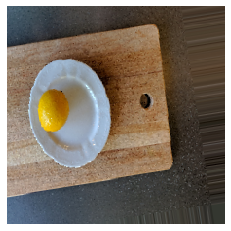

Class is: Lemon
Predicted Class is: Lemon


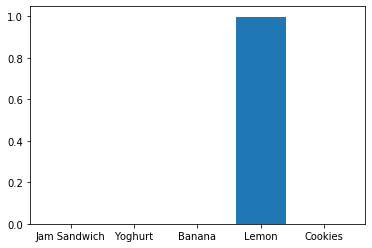

In [0]:
#@title Performance on test set generator{run:"auto"}
category = 3 #@param [0,1,2,3,4] {type:"raw"}
test_images, test_image_label = next(test_data_gen)
image = test_images[category]
label = test_image_label[category]
plt.imshow(image)
plt.axis("off")
plt.show()
print("Class is: {}".format(categories[category]))
x = np.expand_dims(test_images[category], axis=0)
prediction = classification_model.predict(x)
plt.bar(categories,prediction[0])
print("Predicted Class is: {}".format(categories[np.argmax(prediction)]))

In [0]:
classification_model.evaluate(images_test,labels_test,verbose=0)[1]

0.988

## Savings Weights

In [0]:
classification_model.save_weights("Triplet Model/data/triplet_trained_model")